Schuch Jakob - 1910567022, Würflinger Patrick - 1910567023

# Indiana Jones Detection

In [1]:
import cv2
import logging, os
import tensorflow as tf
import imutils as utils
import numpy as np
import glob

from PIL import Image, ImageDraw, ImageFont
from sklearn.metrics import accuracy_score, confusion_matrix
from matplotlib import pyplot as plt
from scipy.ndimage.interpolation import rotate

from utils import ops as utils_ops
from utils import label_map_util
from utils import visualization_utils as vis_util

%matplotlib inline

In [2]:
logging.disable(logging.WARNING)
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"

In [3]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    # Restrict TensorFlow to only use the first GPU
    try:
        tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
    except RuntimeError as e:
        # Visible devices must be set before GPUs have been initialized
        print(e)

1 Physical GPUs, 1 Logical GPU


In [4]:
# read background image for shading correction
imgbackground = cv2.imread('../../img/Other/image_100.jpg')

## Call of first AI: Segmentation of Indiana Jones

In [5]:
#  machine learning stuff
labelmap_path = "../../config/labelmap.pbtxt"
category_index = label_map_util.create_category_index_from_labelmap(
    labelmap_path, use_display_name=True)
tf.keras.backend.clear_session()
model = tf.saved_model.load('../../model/saved_model')

Scores:  [0.93367016 0.11604067 0.03464857]
Boxes:  [[0.07521604 0.33875704 0.75916857 0.7634231 ]
 [0.07595687 0.33245066 0.76059365 0.7615893 ]
 [0.         0.         0.9649753  0.65440273]]
Classes:  [2 3 1]


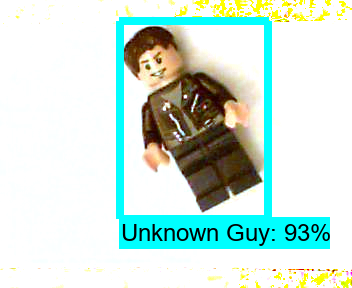

Scores:  [0.99976546 0.8692032  0.44192687]
Boxes:  [[0.23590823 0.27249068 0.82447106 0.7013935 ]
 [0.17760175 0.77968097 0.91178405 0.9963038 ]
 [0.19218715 0.00452562 0.8221748  0.13647547]]
Classes:  [1 2 3]


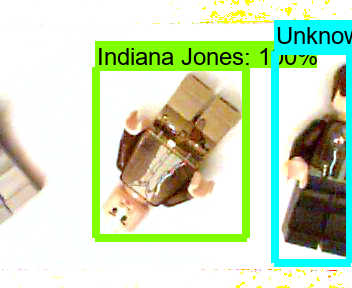

Scores:  [0.9989396  0.9334498  0.40233818]
Boxes:  [[0.3916724  0.25154415 0.8262082  0.7859999 ]
 [0.1950885  0.00280532 0.8403625  0.19647229]
 [0.18667425 0.0017837  0.84422505 0.19680826]]
Classes:  [1 3 2]


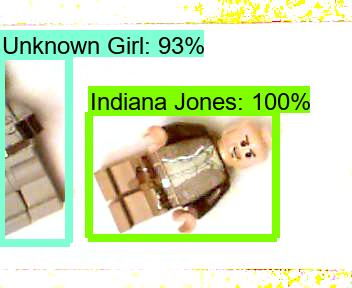

Scores:  [0.96539736 0.8950416  0.03753702]
Boxes:  [[0.13774419 0.3986478  0.8482518  0.74806213]
 [0.11960746 0.72221535 0.85158294 0.99962693]
 [0.16070746 0.6993934  0.8586139  1.        ]]
Classes:  [3 2 1]


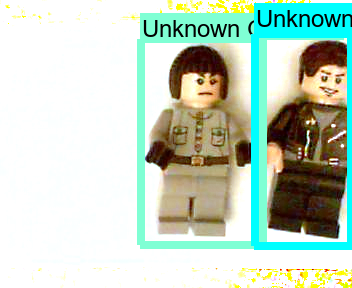

Scores:  [0.99828976 0.13481821 0.11944515]
Boxes:  [[0.16497946 0.4221948  0.9014998  0.8011992 ]
 [0.28921434 0.         0.8378291  0.10124056]
 [0.27082014 0.00422    0.8738762  0.10010034]]
Classes:  [1 3 2]


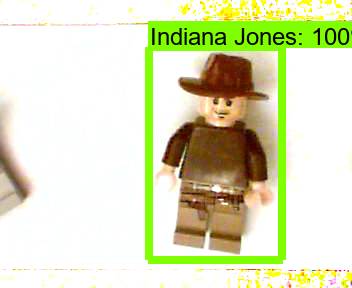

Scores:  [0.99987936 0.9883243  0.03951944]
Boxes:  [[0.17838435 0.27481455 0.8429256  0.78228337]
 [0.18412638 0.0042685  0.70137656 0.21696234]
 [0.12373921 0.00168385 0.7519727  0.22837415]]
Classes:  [1 3 2]


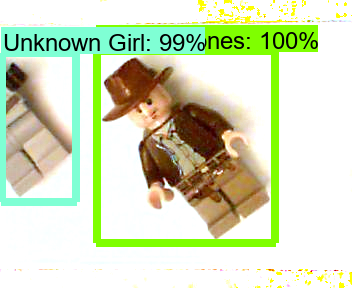

Scores:  [0.9992619  0.11291595 0.10002858]
Boxes:  [[0.13157822 0.39444414 0.85117435 0.7476903 ]
 [0.3973142  0.00160281 0.7781243  0.1828808 ]
 [0.2502598  0.00337552 0.76220196 0.19283727]]
Classes:  [1 2 3]


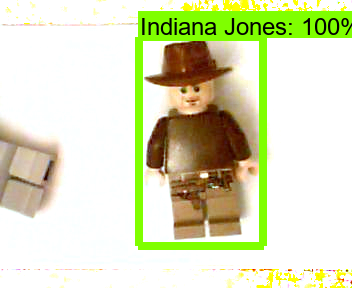

Scores:  [0.99799    0.09039511 0.08339998]
Boxes:  [[0.17682166 0.3166296  0.8999116  0.6996861 ]
 [0.26700187 0.9667315  0.88239294 0.99558467]
 [0.26700187 0.9667315  0.88239294 0.99558467]]
Classes:  [1 3 2]


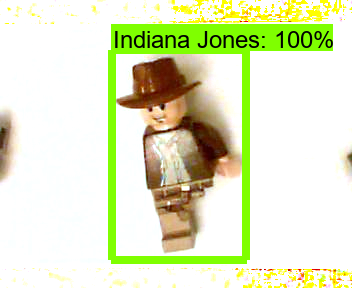

Scores:  [0.9965922  0.06060858 0.043324  ]
Boxes:  [[0.16017774 0.4210822  0.89199543 0.796755  ]
 [0.71581554 0.         1.         0.84346235]
 [0.16484405 0.41553044 0.8964056  0.7999449 ]]
Classes:  [1 3 2]


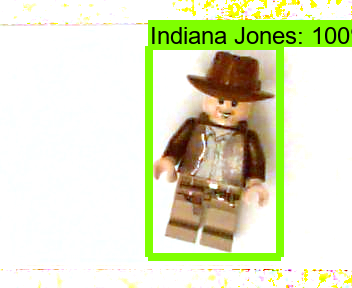

Scores:  [0.9977428  0.18822113 0.12889488]
Boxes:  [[0.15686353 0.4233289  0.8911662  0.81129575]
 [0.2897036  0.00248688 0.73450917 0.20951185]
 [0.27422333 0.00132057 0.7272085  0.20812675]]
Classes:  [1 2 3]


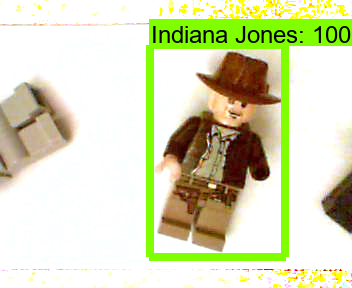

Scores:  [0.9352807  0.90005696 0.22505678]
Boxes:  [[0.22346182 0.6220599  0.73129857 1.        ]
 [0.26739866 0.01334263 0.7500081  0.47300667]
 [0.25221398 0.         0.74139464 0.4615782 ]]
Classes:  [2 3 1]


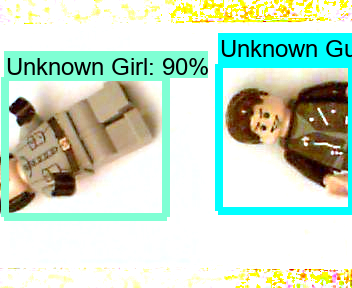

Scores:  [0.99813855 0.9630974  0.08879274]
Boxes:  [[1.18284866e-01 4.44458544e-01 8.32951784e-01 8.64301860e-01]
 [1.71123415e-01 5.75020909e-04 7.41576254e-01 3.28992724e-01]
 [1.81766942e-01 0.00000000e+00 7.41223931e-01 3.47684830e-01]]
Classes:  [1 3 2]


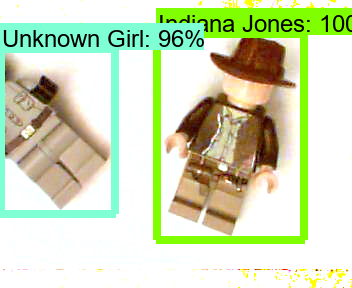

Scores:  [0.9980432 0.9378152 0.8062126]
Boxes:  [[0.18397216 0.27406216 0.8683873  0.6476195 ]
 [0.26594305 0.00262133 0.7784471  0.24318492]
 [0.22799236 0.78058827 0.66368973 0.99682   ]]
Classes:  [1 2 3]


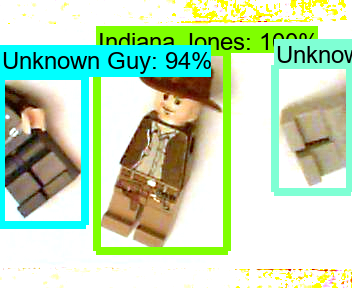

Scores:  [0.998841   0.06183271 0.04334816]
Boxes:  [[0.15228775 0.47058988 0.88062596 0.8112184 ]
 [0.01611164 0.00234095 0.63195145 0.10114871]
 [0.69316566 0.9592332  1.         0.9997756 ]]
Classes:  [1 3 2]


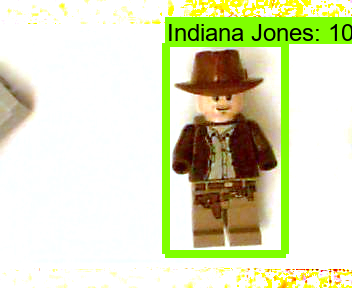

Scores:  [0.9986021  0.9663448  0.14309658]
Boxes:  [[0.12735063 0.5275296  0.8521819  0.89994526]
 [0.03215442 0.0022976  0.73147416 0.27466625]
 [0.02997118 0.00204872 0.72907805 0.27311945]]
Classes:  [1 3 2]


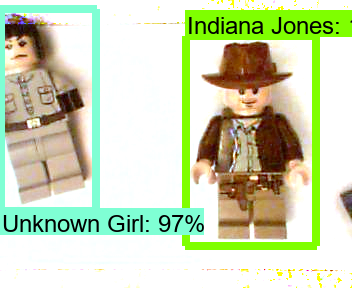

Scores:  [0.99863297 0.26417652 0.1341337 ]
Boxes:  [[0.10956328 0.35953945 0.8532412  0.70775896]
 [0.34621727 0.8926738  0.8542901  1.        ]
 [0.09418909 0.00270217 0.72802925 0.22535288]]
Classes:  [1 2 3]


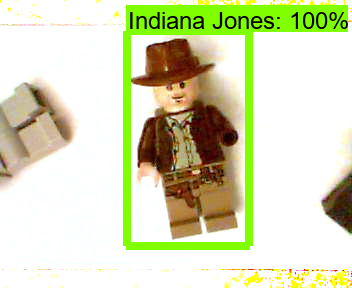

Scores:  [0.9968899  0.04647933 0.03077335]
Boxes:  [[0.131892   0.28894508 0.84898186 0.6474929 ]
 [0.14268188 0.28036952 0.8493963  0.6471518 ]
 [0.65723866 0.01144382 1.         0.30537668]]
Classes:  [1 2 3]


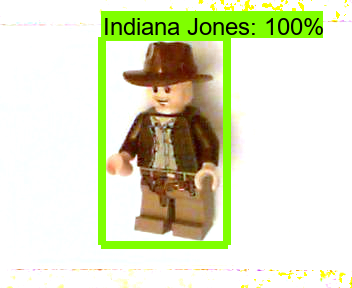

Scores:  [0.99966264 0.86238474 0.09307656]
Boxes:  [[0.24731629 0.20154135 0.9123199  0.5570535 ]
 [0.18155487 0.78198904 0.91464156 0.996172  ]
 [0.90925574 0.72781307 1.         1.        ]]
Classes:  [1 2 3]


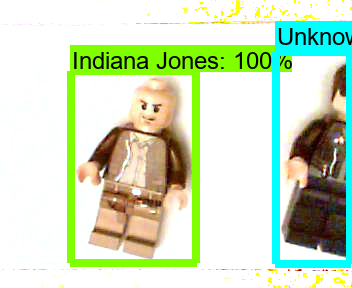

Scores:  [0.99909174 0.5891489  0.4032869 ]
Boxes:  [[0.24978934 0.42244905 0.9048761  0.8142497 ]
 [0.18581921 0.00134037 0.8559798  0.15834673]
 [0.18357806 0.00242187 0.8585439  0.16025169]]
Classes:  [1 3 2]


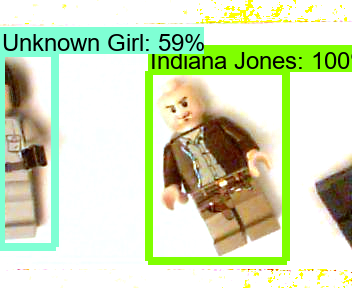

Scores:  [0.999435   0.7717886  0.06222089]
Boxes:  [[0.2796273  0.40357882 0.88289005 0.756368  ]
 [0.20538801 0.82331055 0.77306056 0.9969943 ]
 [0.09024218 0.00484759 0.66858757 0.14538413]]
Classes:  [1 2 3]


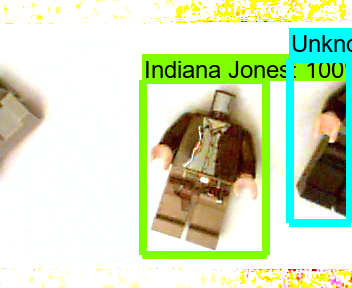

Scores:  [0.9997427  0.05997766 0.04604882]
Boxes:  [[0.15325189 0.30571148 0.82673883 0.8228775 ]
 [0.03701027 0.         0.63789964 0.10144366]
 [0.15910074 0.30737278 0.831623   0.825783  ]]
Classes:  [1 3 2]


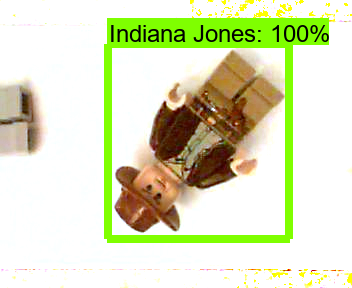

Scores:  [0.9993524  0.97046125 0.0646742 ]
Boxes:  [[0.15410587 0.35038316 0.8261987  0.78894067]
 [0.27374995 0.00404013 0.79400826 0.18936157]
 [0.1547655  0.35179895 0.8287246  0.7923716 ]]
Classes:  [1 3 2]


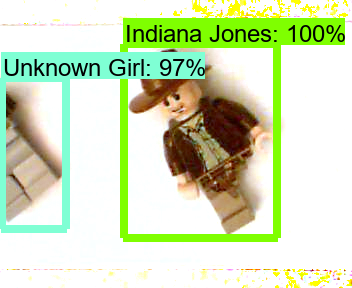

Scores:  [0.9991406  0.07601397 0.06136235]
Boxes:  [[0.19290413 0.3541922  0.8410977  0.7637333 ]
 [0.2672868  0.9670482  0.8751961  0.99603635]
 [0.2893469  0.9650457  0.84152234 0.99652886]]
Classes:  [1 3 2]


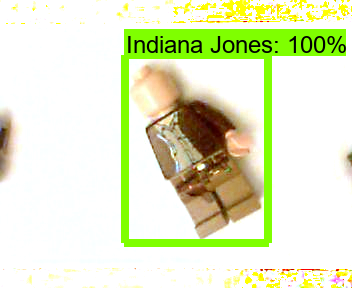

Scores:  [0.9992261  0.98986036 0.32010958]
Boxes:  [[0.13625228 0.25270176 0.84588337 0.6280683 ]
 [0.18614909 0.00441732 0.6984362  0.21786615]
 [0.195066   0.84564495 0.84128535 0.9980744 ]]
Classes:  [1 3 2]


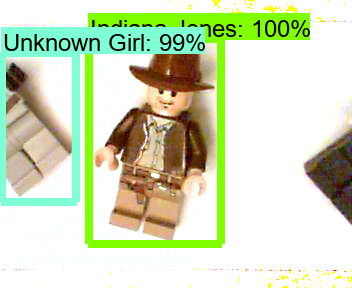

Scores:  [0.99989736 0.9877572  0.31229958]
Boxes:  [[0.17774807 0.27633736 0.84370816 0.78602326]
 [0.19225314 0.00441417 0.70005625 0.21584487]
 [0.18339926 0.84962404 0.8237352  1.        ]]
Classes:  [1 3 2]


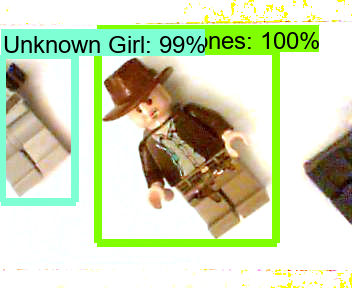

Scores:  [0.9971871  0.12674223 0.07567226]
Boxes:  [[0.1570286  0.40590686 0.89605105 0.8110809 ]
 [0.16393654 0.92188    0.7496842  0.99774647]
 [0.15662365 0.9233469  0.73603    0.998418  ]]
Classes:  [1 3 2]


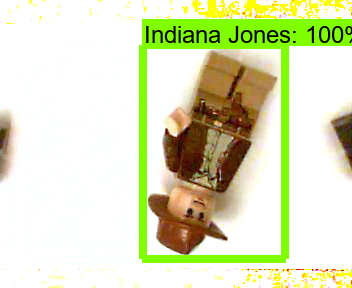

Scores:  [0.9993783  0.9878219  0.02699379]
Boxes:  [[0.19679487 0.48672795 0.9207824  0.85879135]
 [0.25744325 0.00425316 0.7750149  0.2105722 ]
 [0.6990901  0.96466464 1.         0.99749464]]
Classes:  [1 3 2]


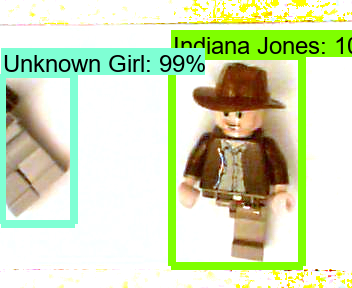

Scores:  [0.94931567 0.5686391  0.0352569 ]
Boxes:  [[0.14287744 0.00263458 0.8380028  0.19792962]
 [0.1595159  0.8377025  0.9020777  0.9982407 ]
 [0.1515658  0.8354606  0.899468   0.99520487]]
Classes:  [3 2 1]


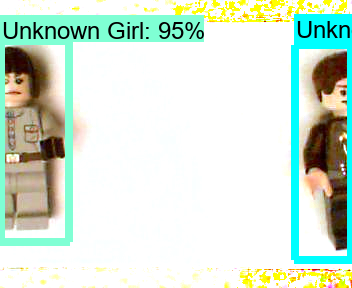

Scores:  [0.99859613 0.20771255 0.04181935]
Boxes:  [[0.24104773 0.20642689 0.81256294 0.78741646]
 [0.14971896 0.89319354 0.6882363  0.99881417]
 [0.15707587 0.89345515 0.67591405 0.99754333]]
Classes:  [1 3 2]


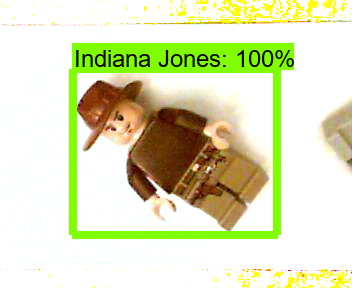

Scores:  [0.99925524 0.98001057 0.02804303]
Boxes:  [[0.11931867 0.43300202 0.83477074 0.790882  ]
 [0.2641971  0.00419793 0.7880298  0.19618838]
 [0.2680706  0.00298977 0.7873642  0.19458717]]
Classes:  [1 3 2]


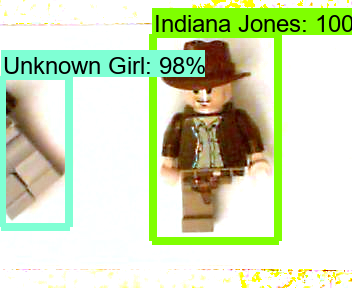

Scores:  [0.99807775 0.42720512 0.04542748]
Boxes:  [[1.7338082e-01 3.0604526e-01 8.4355617e-01 7.2279549e-01]
 [3.5722438e-01 4.9017370e-05 8.3080363e-01 1.2374846e-01]
 [2.1502562e-01 9.5018429e-01 8.4169078e-01 9.9814576e-01]]
Classes:  [1 2 3]


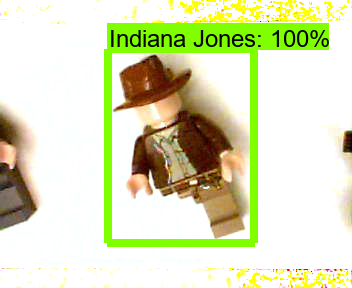

Scores:  [0.99781644 0.16916549 0.11842193]
Boxes:  [[0.22403437 0.35549018 0.8198745  0.92774403]
 [0.2880982  0.0023693  0.7376641  0.20720471]
 [0.27465126 0.00107805 0.7298638  0.20760955]]
Classes:  [1 2 3]


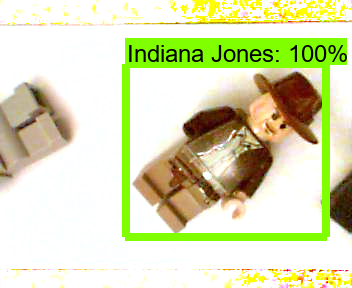

Scores:  [0.9798029  0.11475514 0.01540894]
Boxes:  [[0.09671105 0.46474642 0.79692894 0.8820879 ]
 [0.09563146 0.4640303  0.8005016  0.88150954]
 [0.00668149 0.         1.         0.9146832 ]]
Classes:  [3 2 1]


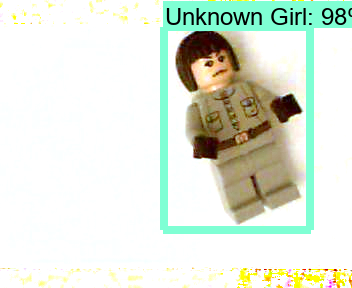

Scores:  [0.99776757 0.5949377  0.03431396]
Boxes:  [[1.7816028e-01 3.8064292e-01 8.3138114e-01 8.1078768e-01]
 [3.6440477e-01 7.8347325e-04 8.6591500e-01 1.5675581e-01]
 [9.6518433e-01 6.1391294e-04 1.0000000e+00 2.6463038e-01]]
Classes:  [1 2 3]


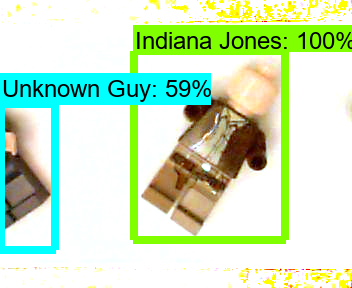

Scores:  [0.9960681  0.98757905 0.02822331]
Boxes:  [[0.14944582 0.4078464  0.8345285  0.82839197]
 [0.25286648 0.00416072 0.77567476 0.2100289 ]
 [0.21632783 0.01395148 0.8440113  0.23324253]]
Classes:  [1 3 2]


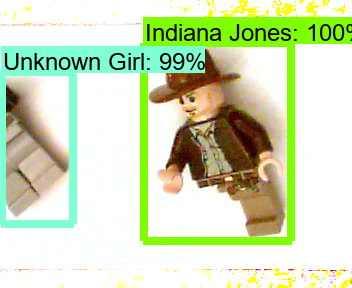

Scores:  [0.9997029  0.9766674  0.03691895]
Boxes:  [[1.5851592e-01 4.7111216e-01 8.9305699e-01 8.8915431e-01]
 [2.2033475e-01 6.5483153e-04 8.1280237e-01 2.6067156e-01]
 [2.0132440e-01 0.0000000e+00 8.2495254e-01 2.6437718e-01]]
Classes:  [1 3 2]


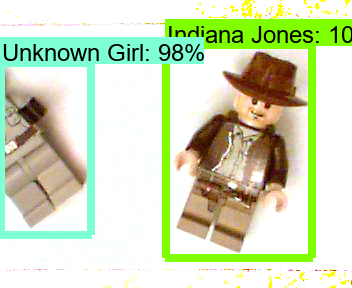

Scores:  [0.99933714 0.97149044 0.8670246 ]
Boxes:  [[1.2027204e-01 3.1498295e-01 7.9552269e-01 6.7820698e-01]
 [1.8338880e-01 7.4401498e-04 7.8444606e-01 2.6885849e-01]
 [1.7373924e-01 7.7883595e-01 9.0990078e-01 9.9659282e-01]]
Classes:  [1 3 2]


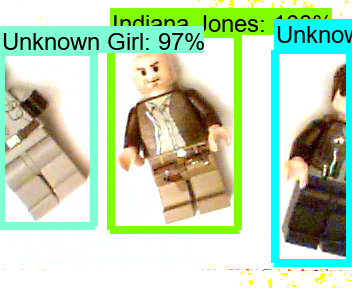

Scores:  [0.97183144 0.71052676 0.0829882 ]
Boxes:  [[0.11133381 0.5221909  0.7341576  0.88590276]
 [0.10810634 0.5182651  0.7389409  0.8851659 ]
 [0.11133381 0.5221909  0.7341576  0.88590276]]
Classes:  [1 2 3]


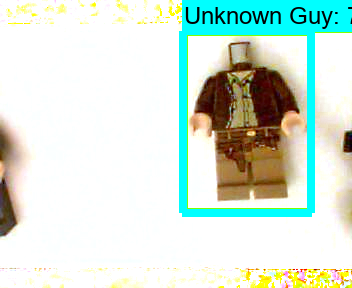

Scores:  [0.9993338  0.27888754 0.21709882]
Boxes:  [[0.15485741 0.353596   0.82273805 0.7949164 ]
 [0.26872373 0.9065972  0.74115396 0.99915844]
 [0.14548168 0.00208189 0.80581367 0.10387375]]
Classes:  [1 2 3]


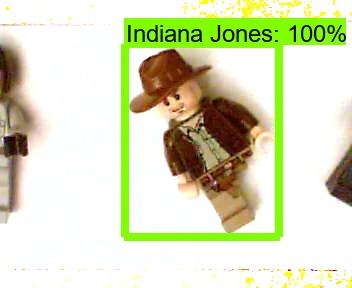

Scores:  [0.9992778  0.6302631  0.03662314]
Boxes:  [[1.4707226e-01 3.7045199e-01 8.8257962e-01 7.1623272e-01]
 [3.7078270e-01 6.3593686e-04 8.6587352e-01 1.5777853e-01]
 [4.9640870e-01 4.2063594e-03 1.0000000e+00 2.0903157e-01]]
Classes:  [1 2 3]


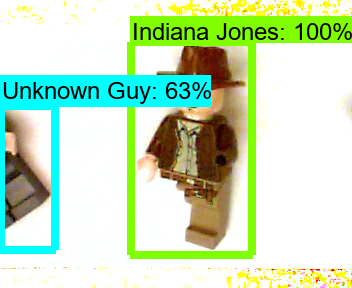

Scores:  [0.9965911  0.48444214 0.1773452 ]
Boxes:  [[0.3311947  0.17522964 0.7822821  0.7826438 ]
 [0.32918096 0.         0.7998996  0.14921531]
 [0.34911814 0.1577276  0.78443027 0.765213  ]]
Classes:  [1 2 3]


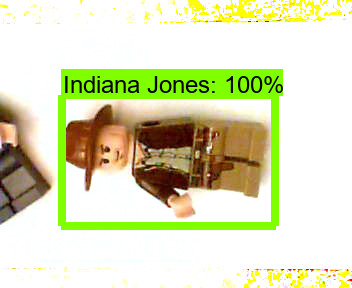

Scores:  [0.99971575 0.47158253 0.05163944]
Boxes:  [[2.1661152e-01 4.5202821e-01 8.2165664e-01 8.4323269e-01]
 [3.5387871e-01 4.8644468e-04 8.1964397e-01 1.2144971e-01]
 [2.1197434e-01 9.4506162e-01 8.1319094e-01 9.9829835e-01]]
Classes:  [1 2 3]


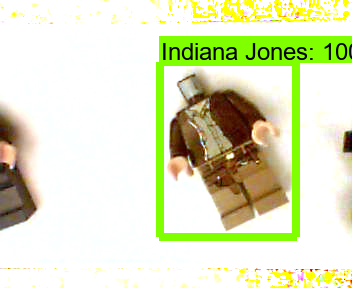

Scores:  [0.99932826 0.98712707 0.9429833 ]
Boxes:  [[0.16462377 0.34424192 0.8748145  0.74494606]
 [0.25895953 0.00426784 0.7759827  0.20502377]
 [0.21841003 0.7568111  0.67348236 0.99863404]]
Classes:  [1 3 2]


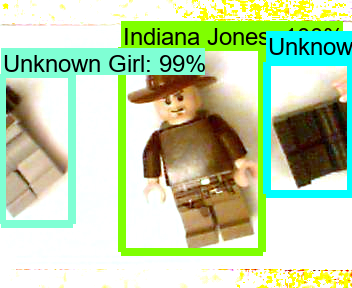

Scores:  [0.99907637 0.98508716 0.04020805]
Boxes:  [[0.09404018 0.31069887 0.80323905 0.74969864]
 [0.25190625 0.00396574 0.7744449  0.20917934]
 [0.21042949 0.00848632 0.83120084 0.22848639]]
Classes:  [1 3 2]


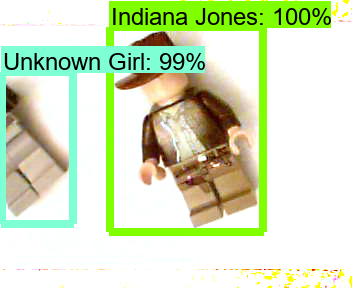

Scores:  [0.9996152  0.81082654 0.10715704]
Boxes:  [[0.31884336 0.25531203 0.79020846 0.71575826]
 [0.23066808 0.8227319  0.77363336 0.99743015]
 [0.         0.         0.6745902  0.14224322]]
Classes:  [1 2 3]


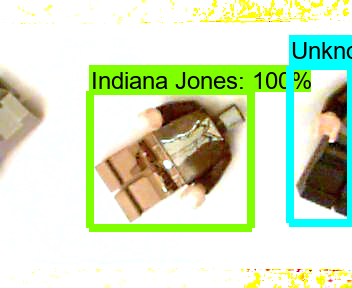

Scores:  [0.9987238  0.11344326 0.0710721 ]
Boxes:  [[0.08198056 0.3720675  0.83121467 0.72269624]
 [0.24518855 0.00304423 0.7608691  0.19362484]
 [0.392389   0.00176198 0.7745876  0.18257481]]
Classes:  [1 3 2]


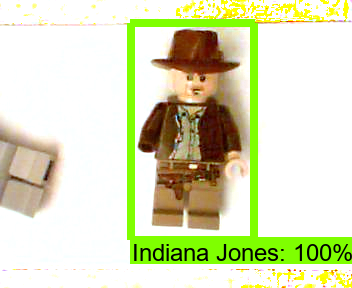

Scores:  [0.99934155 0.29128343 0.22707765]
Boxes:  [[0.11700556 0.38517845 0.82084954 0.74833393]
 [0.28387436 0.9071578  0.73588985 0.9979832 ]
 [0.14411967 0.00163658 0.80096424 0.1051707 ]]
Classes:  [1 2 3]


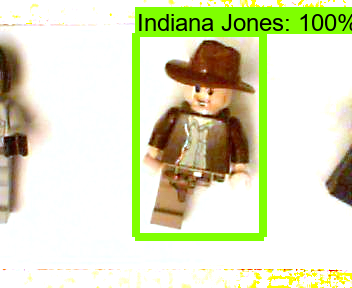

Scores:  [0.96074384 0.11814047 0.03689319]
Boxes:  [[0.147805   0.6038839  0.8826552  0.9909645 ]
 [0.15201691 0.61181647 0.864956   0.9862924 ]
 [0.         0.         1.         0.88442874]]
Classes:  [3 2 1]


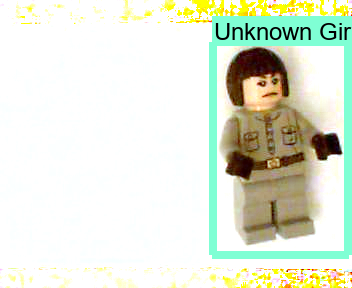

Scores:  [0.99789065 0.9864486  0.953187  ]
Boxes:  [[0.11440796 0.28031057 0.8524361  0.65121585]
 [0.14420184 0.00379732 0.65351975 0.23472792]
 [0.41265205 0.70621544 0.91357845 0.9967037 ]]
Classes:  [1 3 2]


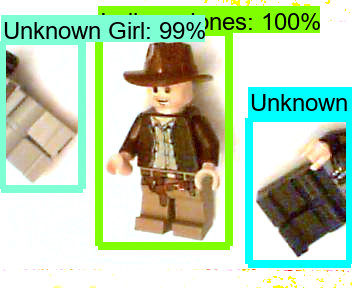

Scores:  [0.99830735 0.98446816 0.19355087]
Boxes:  [[0.12093253 0.4737897  0.8288343  0.85260046]
 [0.1736142  0.         0.65647906 0.40781325]
 [0.17144792 0.00102583 0.66107416 0.4082796 ]]
Classes:  [1 3 2]


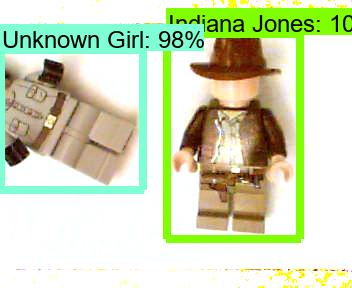

Scores:  [0.9991629  0.93240106 0.3901149 ]
Boxes:  [[0.21341383 0.33980972 0.87281007 0.70801777]
 [0.18221463 0.00302287 0.8404868  0.1996074 ]
 [0.17475931 0.00206158 0.8502115  0.20217106]]
Classes:  [1 3 2]


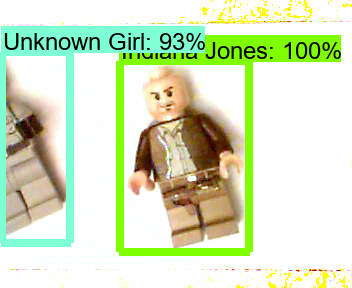

Scores:  [0.99988306 0.8029506  0.1036758 ]
Boxes:  [[0.17250486 0.29868516 0.77392524 0.66596067]
 [0.2161809  0.8207485  0.7799932  0.997129  ]
 [0.         0.         0.6688888  0.14811486]]
Classes:  [1 2 3]


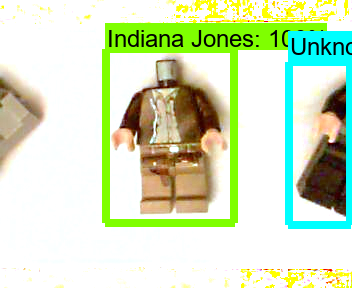

Scores:  [0.9974819  0.987313   0.06392647]
Boxes:  [[0.17650692 0.35211867 0.7851058  0.8837672 ]
 [0.2544375  0.00396592 0.77627265 0.21166319]
 [0.17837413 0.35153863 0.78752357 0.8848809 ]]
Classes:  [1 3 2]


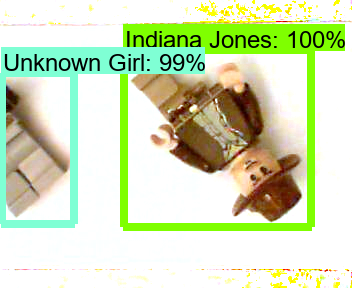

Scores:  [0.99887556 0.784724   0.09896447]
Boxes:  [[0.31732106 0.35218555 0.7532857  0.79999965]
 [0.35866582 0.00109925 0.826718   0.16729268]
 [0.33753407 0.3505688  0.74700946 0.8029499 ]]
Classes:  [1 2 3]


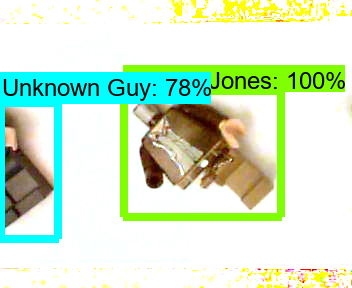

Scores:  [0.99663216 0.627244   0.05494035]
Boxes:  [[1.3238126e-01 5.5078197e-01 8.8778692e-01 9.7345972e-01]
 [3.4336293e-01 8.4711611e-04 8.1031311e-01 1.6134395e-01]
 [7.4747109e-01 0.0000000e+00 1.0000000e+00 1.0000000e+00]]
Classes:  [1 2 3]


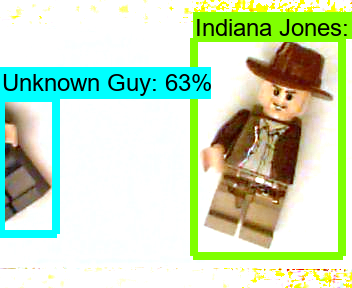

Scores:  [0.99847597 0.7257696  0.03791366]
Boxes:  [[0.17472683 0.33001402 0.8751207  0.72754633]
 [0.36558777 0.00183378 0.83532536 0.16052131]
 [0.35212225 0.00173321 0.84021217 0.15880358]]
Classes:  [1 2 3]


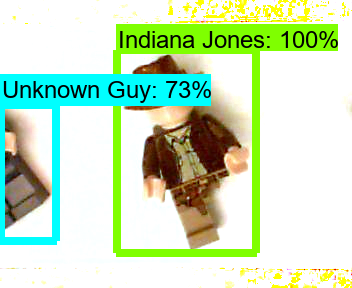

Scores:  [0.9996136  0.12868127 0.09784635]
Boxes:  [[0.13522041 0.3123329  0.85183597 0.75991535]
 [0.30839258 0.         0.8428917  0.09940755]
 [0.29874274 0.         0.83901274 0.10052641]]
Classes:  [1 3 2]


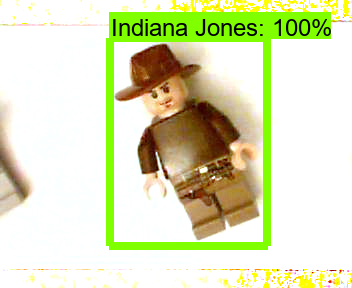

Scores:  [0.99765956 0.9607978  0.07028833]
Boxes:  [[0.11994221 0.43399522 0.8491284  0.84889317]
 [0.06710479 0.         0.6402196  0.32097334]
 [0.07776242 0.         0.65275353 0.3256347 ]]
Classes:  [1 3 2]


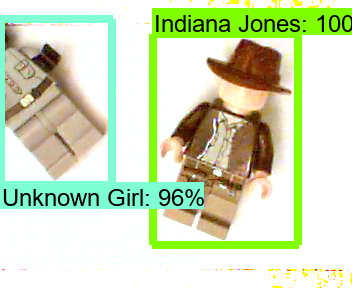

Scores:  [0.9972228  0.9900594  0.04226977]
Boxes:  [[0.29463795 0.24952301 0.7535223  0.8462211 ]
 [0.16881794 0.00316854 0.68249303 0.23435667]
 [0.11939348 0.01206398 0.7356336  0.23176727]]
Classes:  [1 3 2]


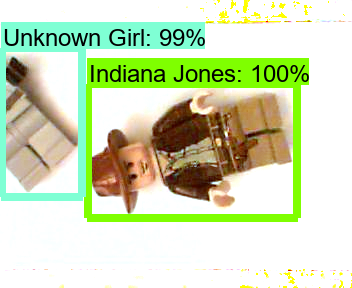

Scores:  [0.99990344 0.16793388 0.1390696 ]
Boxes:  [[0.20160426 0.34432918 0.8877944  0.82155603]
 [0.29041812 0.00259458 0.72895324 0.21013069]
 [0.28986657 0.00122091 0.73277396 0.21165155]]
Classes:  [1 2 3]


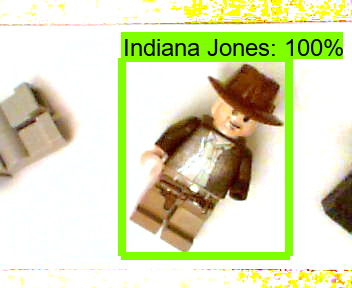

Scores:  [0.99940765 0.60551965 0.36175263]
Boxes:  [[0.2617614  0.370391   0.92843026 0.7293024 ]
 [0.17962866 0.0030349  0.8571584  0.15907682]
 [0.17962866 0.0030349  0.8571584  0.15907682]]
Classes:  [1 3 2]


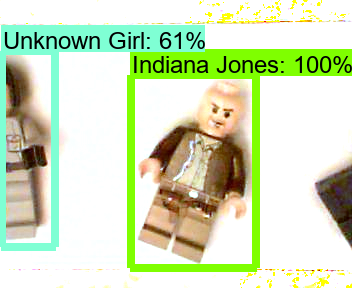

Scores:  [0.9664454  0.2178235  0.08857676]
Boxes:  [[0.23038769 0.1252836  0.7025425  0.7048834 ]
 [0.23441237 0.12339985 0.70851    0.7132842 ]
 [0.29684183 0.94003975 0.88368696 0.9978483 ]]
Classes:  [3 1 2]


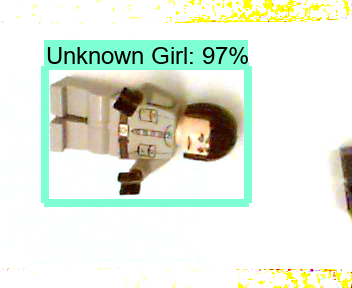

Scores:  [0.99972945 0.5149169  0.08477794]
Boxes:  [[2.4641280e-01 3.9993000e-01 8.4771067e-01 7.6101029e-01]
 [3.5377687e-01 4.3205544e-04 8.1934017e-01 1.2262678e-01]
 [2.4720937e-01 9.4538176e-01 8.7380105e-01 9.9805021e-01]]
Classes:  [1 2 3]


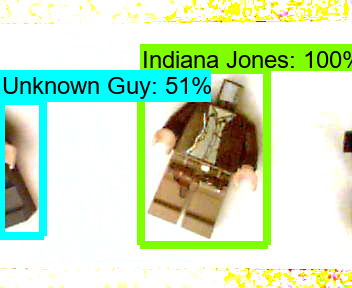

Scores:  [0.9992274  0.97106713 0.12113535]
Boxes:  [[1.3940947e-01 4.6897921e-01 8.5522425e-01 8.5772824e-01]
 [1.6283825e-01 3.0532479e-05 7.5902736e-01 3.6890149e-01]
 [1.7569841e-01 0.0000000e+00 7.5597256e-01 3.8020775e-01]]
Classes:  [1 3 2]


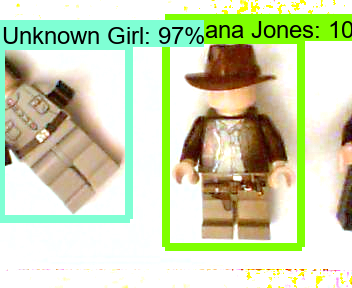

Scores:  [0.99841154 0.96424925 0.49449855]
Boxes:  [[0.15356445 0.2720098  0.85323733 0.67607665]
 [0.19915475 0.0045239  0.7210065  0.18610547]
 [0.26909858 0.8133537  0.871388   0.99767655]]
Classes:  [1 3 2]


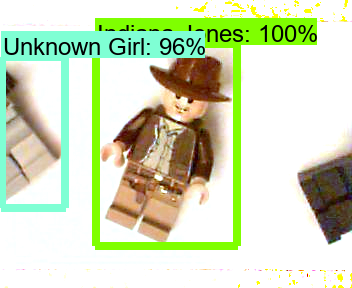

Scores:  [0.99842644 0.96393716 0.14401071]
Boxes:  [[0.17572404 0.40467495 0.8782643  0.77257115]
 [0.36095187 0.         0.802002   0.32222497]
 [0.33769855 0.         0.81450737 0.33045828]]
Classes:  [1 2 3]


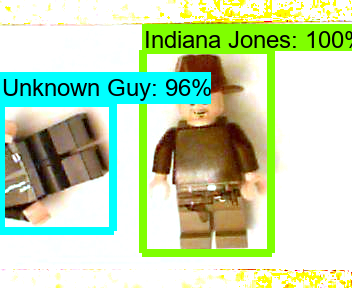

Scores:  [0.9995834  0.98743457 0.33959782]
Boxes:  [[0.12136175 0.38174137 0.84623104 0.7698569 ]
 [0.18592255 0.00378081 0.70444375 0.22174089]
 [0.17463553 0.8444006  0.84119123 0.9993569 ]]
Classes:  [1 3 2]


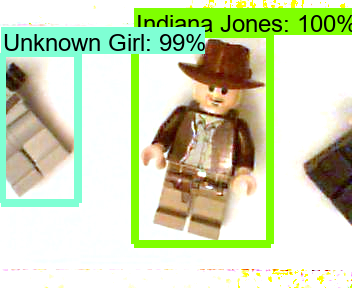

Scores:  [0.99962914 0.48709342 0.05623708]
Boxes:  [[0.296558   0.35444275 0.8740155  0.77500033]
 [0.33520332 0.00471701 0.8238163  0.11996017]
 [0.20333968 0.9491997  0.8489559  0.9981153 ]]
Classes:  [1 2 3]


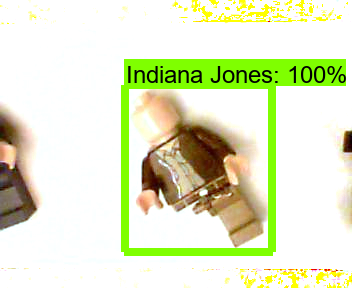

Scores:  [0.9994221 0.9449503 0.911453 ]
Boxes:  [[0.09615903 0.31966174 0.8408337  0.6594507 ]
 [0.26199508 0.00119182 0.7672357  0.2561089 ]
 [0.22865601 0.7751049  0.6673936  0.9964919 ]]
Classes:  [1 2 3]


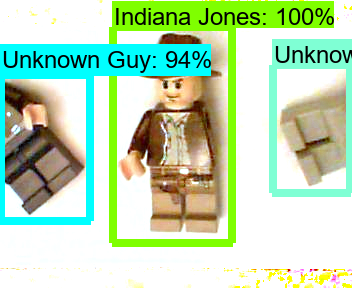

Scores:  [0.9988458 0.9719429 0.0356577]
Boxes:  [[0.10680308 0.46055704 0.7906946  0.8671134 ]
 [0.27503026 0.00394657 0.79319406 0.1908091 ]
 [0.27930966 0.00299527 0.7925305  0.18991244]]
Classes:  [1 3 2]


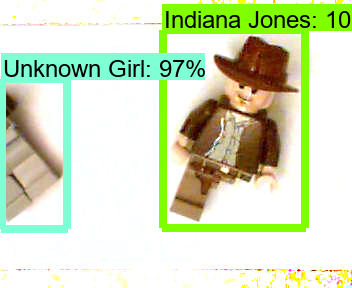

Scores:  [0.99885464 0.9580247  0.13651398]
Boxes:  [[0.17199445 0.49053493 0.91366374 0.8934401 ]
 [0.27574435 0.         0.7444484  0.30994308]
 [0.2722571  0.         0.73843753 0.3088255 ]]
Classes:  [1 2 3]


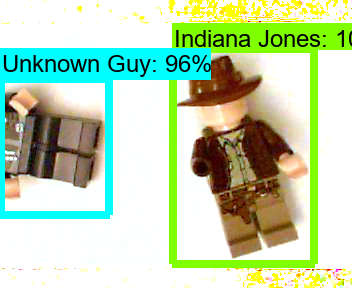

Scores:  [0.99920744 0.10839374 0.07440282]
Boxes:  [[0.12646441 0.21096942 0.80183506 0.67676413]
 [0.28270394 0.         0.82044667 0.10082673]
 [0.28814575 0.         0.8171655  0.09983649]]
Classes:  [1 2 3]


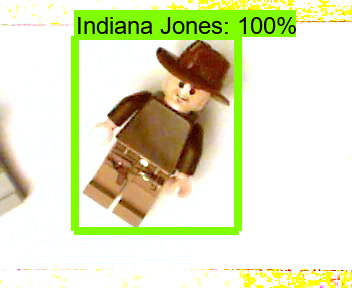

Scores:  [0.9980063  0.07745925 0.03708842]
Boxes:  [[0.29648975 0.23994601 0.7551445  0.8420441 ]
 [0.29648975 0.23994601 0.7551445  0.8420441 ]
 [0.2690413  0.00218802 0.5981047  0.12828976]]
Classes:  [1 3 2]


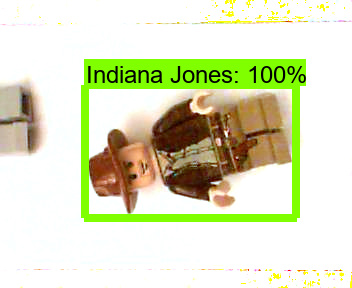

Scores:  [0.99958557 0.08589491 0.02508153]
Boxes:  [[0.22558689 0.43381202 0.8361077  0.80965126]
 [0.         0.00219499 0.62909913 0.10480775]
 [0.72671026 0.         1.         0.52411747]]
Classes:  [1 3 2]


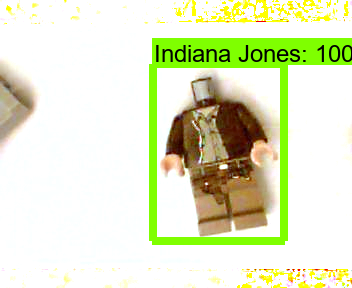

Scores:  [0.99940646 0.85215837 0.07316514]
Boxes:  [[0.21588492 0.14780556 0.8639833  0.5232979 ]
 [0.17791145 0.7824317  0.91308534 0.99616647]
 [0.9064937  0.7246574  1.         1.        ]]
Classes:  [1 2 3]


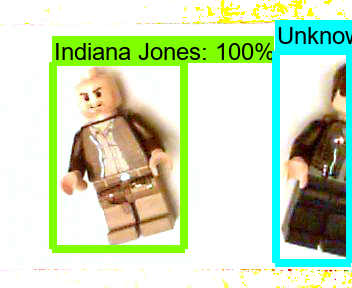

Scores:  [0.92866844 0.7650006  0.20252289]
Boxes:  [[0.13583298 0.57569784 0.8562886  0.96219057]
 [0.13583298 0.57569784 0.8562886  0.96219057]
 [0.13583298 0.57569784 0.8562886  0.96219057]]
Classes:  [2 1 3]


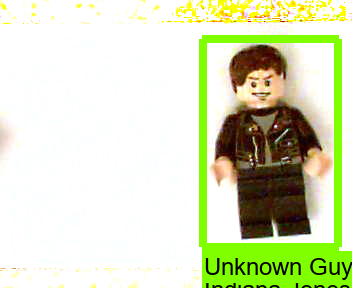

Scores:  [0.9985592  0.8917164  0.20449425]
Boxes:  [[1.2012910e-01 4.0125632e-01 8.5066170e-01 7.8863358e-01]
 [1.1385457e-01 6.4639747e-04 8.1781358e-01 2.4402680e-01]
 [1.0267075e-01 7.5371116e-03 8.3671838e-01 2.5395006e-01]]
Classes:  [1 2 3]


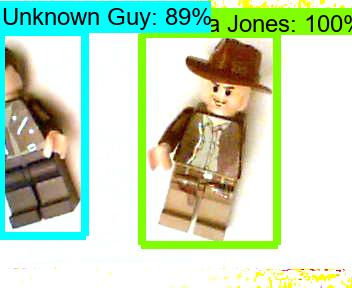

Scores:  [0.9999666  0.7733544  0.17932846]
Boxes:  [[0.19589944 0.3243088  0.88664913 0.8109285 ]
 [0.2918763  0.00282259 0.7932304  0.1315651 ]
 [0.28794882 0.00327267 0.8012308  0.13521825]]
Classes:  [1 3 2]


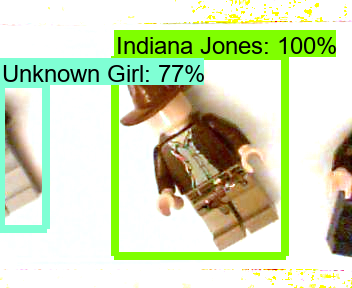

Scores:  [0.99762505 0.9403784  0.13320118]
Boxes:  [[0.10193196 0.27606684 0.8050221  0.6380338 ]
 [0.18944986 0.00416971 0.77093184 0.17954332]
 [0.16741249 0.00450537 0.7803884  0.18056412]]
Classes:  [1 3 2]


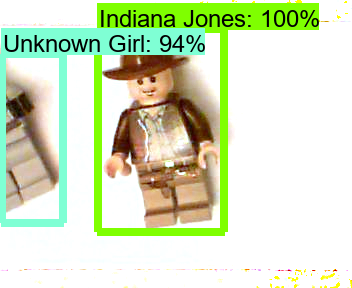

Scores:  [0.9996294  0.07569993 0.05237346]
Boxes:  [[0.18556811 0.11104059 0.8572104  0.5566887 ]
 [0.17285447 0.9256291  0.7484895  0.99787575]
 [0.17285447 0.9256291  0.7484895  0.99787575]]
Classes:  [1 2 3]


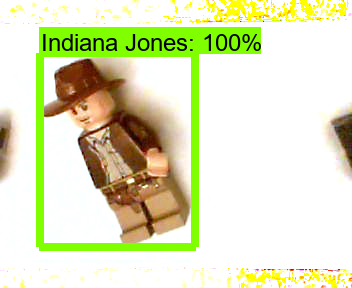

Scores:  [0.99310863 0.08391345 0.01549079]
Boxes:  [[0.36408797 0.3245016  0.82133114 0.9301251 ]
 [0.38989082 0.3059044  0.82936746 0.921461  ]
 [0.63540614 0.00221118 1.         0.34692362]]
Classes:  [1 3 2]


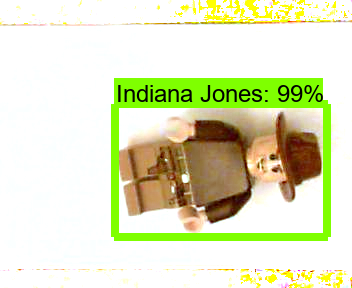

Scores:  [0.99958366 0.98782897 0.3789714 ]
Boxes:  [[0.13369016 0.37698457 0.8456435  0.7569119 ]
 [0.18433854 0.00377929 0.7040369  0.22252525]
 [0.1944347  0.84299165 0.82414734 0.9998316 ]]
Classes:  [1 3 2]


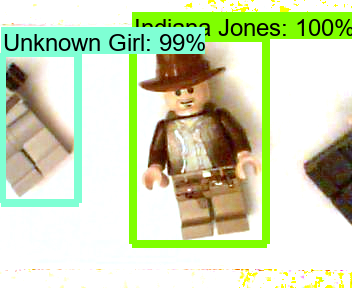

Scores:  [0.999908   0.49260396 0.06432397]
Boxes:  [[0.32076973 0.3507451  0.8040733  0.7553073 ]
 [0.35483605 0.00498893 0.8353519  0.11938529]
 [0.20833932 0.9481107  0.8367298  0.9981283 ]]
Classes:  [1 2 3]


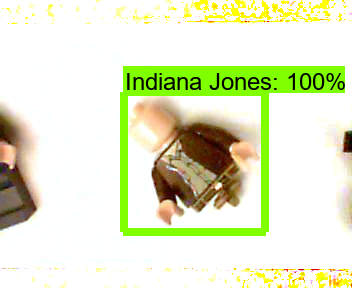

Scores:  [0.9992669  0.81963736 0.5094443 ]
Boxes:  [[0.12286592 0.50689447 0.856642   0.88453317]
 [0.05424263 0.00171119 0.74980927 0.19078228]
 [0.04019948 0.00152456 0.74900174 0.18856788]]
Classes:  [1 3 2]


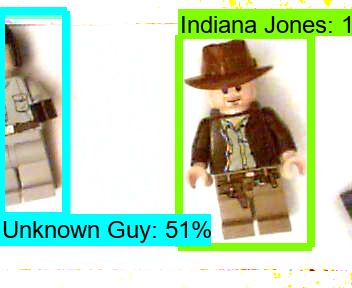

Scores:  [0.9995585  0.86714554 0.08546296]
Boxes:  [[1.7476861e-01 4.5511827e-01 7.9277313e-01 8.3216131e-01]
 [2.9991126e-01 3.2333434e-03 8.0631602e-01 1.9997162e-01]
 [3.1341323e-01 6.9087744e-04 7.9949301e-01 1.9807804e-01]]
Classes:  [1 2 3]


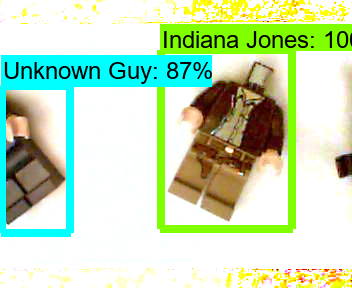

Scores:  [0.9995896  0.9697472  0.07159469]
Boxes:  [[0.1725489  0.35577643 0.8792924  0.77370226]
 [0.18386422 0.00205296 0.7660016  0.31504092]
 [0.4166013  0.9544113  0.8537058  1.        ]]
Classes:  [1 3 2]


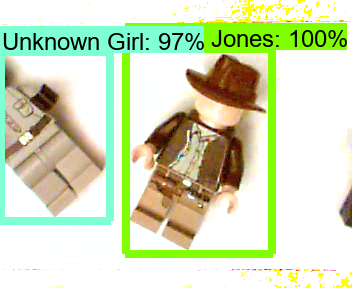

Scores:  [0.999597   0.96996474 0.5123198 ]
Boxes:  [[0.13272543 0.18317899 0.8229229  0.6452029 ]
 [0.19766906 0.         0.7118243  0.18224613]
 [0.26836684 0.81339896 0.8684533  0.9990332 ]]
Classes:  [1 3 2]


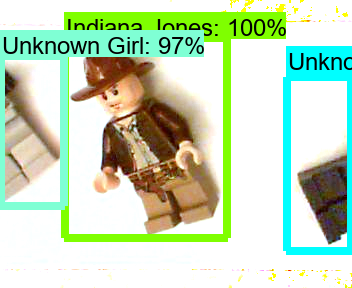

Scores:  [0.99489033 0.98520607 0.95763403]
Boxes:  [[0.08639526 0.28143466 0.8142037  0.68872863]
 [0.25743315 0.00441952 0.77423114 0.2053581 ]
 [0.21720701 0.75375503 0.6759865  0.9984444 ]]
Classes:  [1 3 2]


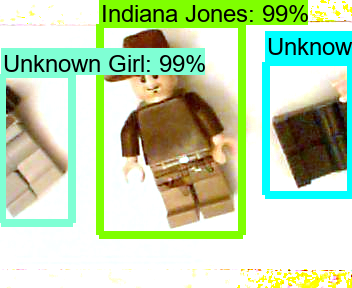

Scores:  [0.99727196 0.92907304 0.27629745]
Boxes:  [[1.1802368e-01 5.7540184e-01 8.5376358e-01 9.7860879e-01]
 [3.0407012e-01 1.2102574e-03 9.0339500e-01 2.9391295e-01]
 [3.0538732e-01 8.9904666e-04 9.1099769e-01 2.9346123e-01]]
Classes:  [1 3 2]


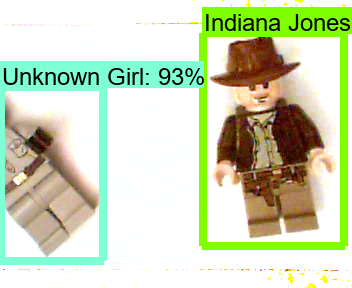

Scores:  [0.99940753 0.4912082  0.05911582]
Boxes:  [[1.73685670e-01 3.66176575e-01 8.39847267e-01 7.43997693e-01]
 [3.50982815e-01 5.07358462e-04 8.21816683e-01 1.22059286e-01]
 [3.47729385e-01 7.99760967e-03 8.45672846e-01 1.18150167e-01]]
Classes:  [1 2 3]


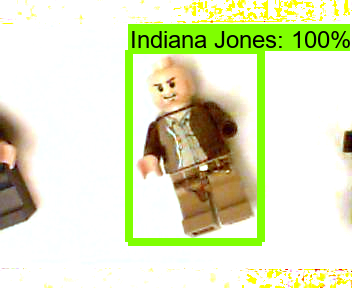

Scores:  [0.9994143  0.94060946 0.24521305]
Boxes:  [[0.17456442 0.5008817  0.9086312  0.9157171 ]
 [0.30895087 0.00153866 0.9030094  0.29239145]
 [0.3095339  0.00093322 0.910704   0.29187155]]
Classes:  [1 3 2]


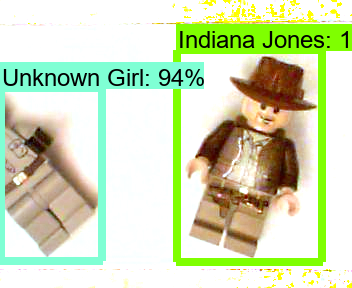

Scores:  [0.9982241  0.25340876 0.045949  ]
Boxes:  [[0.22450948 0.35375386 0.8119562  0.92477816]
 [0.05542448 0.00425027 0.58142567 0.164288  ]
 [0.22450948 0.35375386 0.8119562  0.92477816]]
Classes:  [1 3 2]


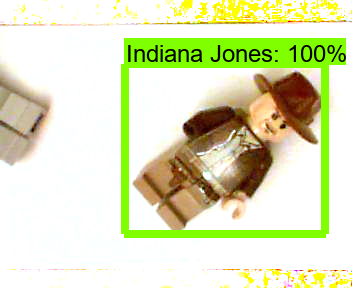

Scores:  [0.9996958  0.9746463  0.04686723]
Boxes:  [[2.5332871e-01 4.0632096e-01 8.4845525e-01 9.8159349e-01]
 [2.2139761e-01 5.8811903e-04 8.1277394e-01 2.6003149e-01]
 [2.5164554e-01 4.0257734e-01 8.5250765e-01 9.8318416e-01]]
Classes:  [1 3 2]


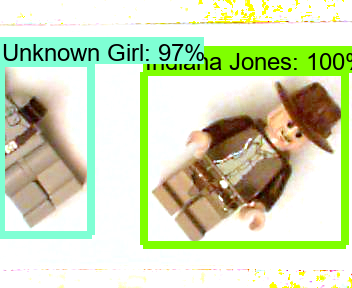

Scores:  [0.9479126  0.2698025  0.06202444]
Boxes:  [[2.2365868e-01 6.4513087e-04 7.3353320e-01 3.1601274e-01]
 [2.3181951e-01 1.8982708e-02 1.0000000e+00 3.3066916e-01]
 [8.0663544e-01 0.0000000e+00 1.0000000e+00 1.0000000e+00]]
Classes:  [2 3 1]


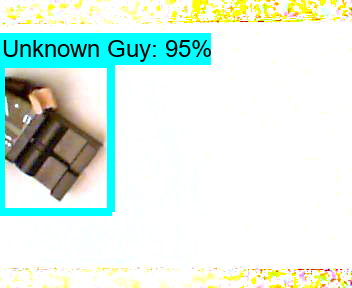

Scores:  [0.99864167 0.9821618  0.06449863]
Boxes:  [[0.11886932 0.43804047 0.8475672  0.82296646]
 [0.17830724 0.         0.67283595 0.2716835 ]
 [0.1854425  0.         0.6729643  0.28833625]]
Classes:  [1 3 2]


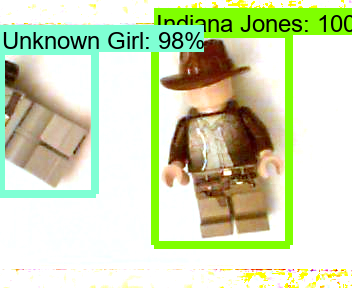

Scores:  [0.9995734  0.9233315  0.19015037]
Boxes:  [[0.130786   0.4831866  0.87098116 0.8797171 ]
 [0.05303169 0.00215842 0.7577088  0.1915076 ]
 [0.04566042 0.00146241 0.7490098  0.19019163]]
Classes:  [1 3 2]


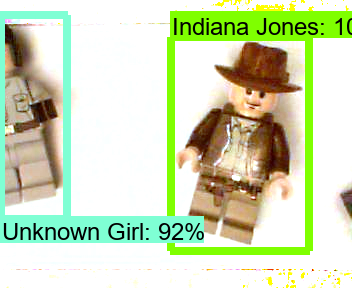

Scores:  [0.9999095  0.8084012  0.13044955]
Boxes:  [[0.2558345  0.18792    0.77872145 0.60123956]
 [0.21543834 0.8203896  0.7805666  0.99715984]
 [0.05166055 0.         0.6838276  0.13359359]]
Classes:  [1 2 3]


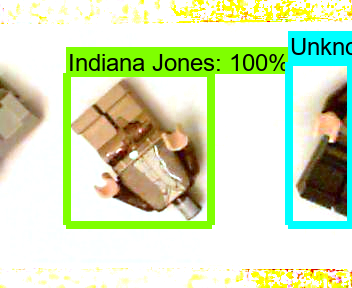

Scores:  [0.9906345  0.08978877 0.02571667]
Boxes:  [[0.20025831 0.45311528 0.84516084 0.9885213 ]
 [0.20025831 0.45311528 0.84516084 0.9885213 ]
 [0.22140533 0.4489017  0.85270846 0.9898117 ]]
Classes:  [3 2 1]


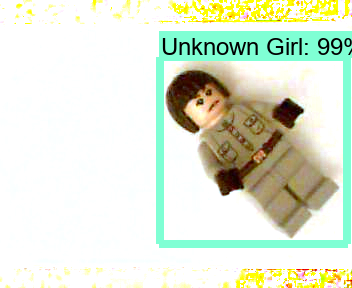

Scores:  [0.9995253  0.17918627 0.07773289]
Boxes:  [[0.13745107 0.30329505 0.8302171  0.8083292 ]
 [0.21996568 0.00284998 0.7653761  0.19575495]
 [0.13745107 0.30329505 0.8302171  0.8083292 ]]
Classes:  [1 3 2]


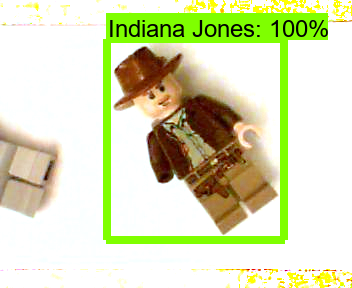

Scores:  [0.9953917 0.7087626 0.4251296]
Boxes:  [[0.11933171 0.4086902  0.827865   0.849758  ]
 [0.17965077 0.00167587 0.8575401  0.17588164]
 [0.1810143  0.00154121 0.8528061  0.17679551]]
Classes:  [1 3 2]


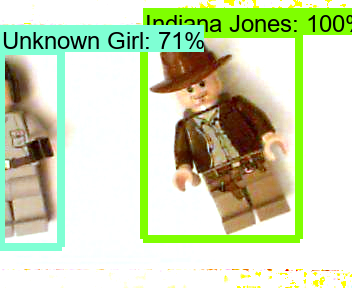

Scores:  [0.9999057  0.7440162  0.03879252]
Boxes:  [[0.19930102 0.4179598  0.9322184  0.91710734]
 [0.33604333 0.00144164 0.8047055  0.1588087 ]
 [0.0682725  0.         0.5180785  0.04420251]]
Classes:  [1 2 3]


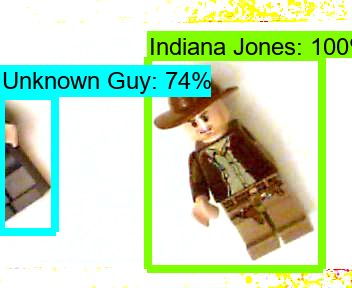

Scores:  [0.998719   0.90038663 0.3394935 ]
Boxes:  [[0.1391736  0.35500163 0.84572065 0.71969956]
 [0.19983955 0.00355253 0.55250394 0.22131494]
 [0.23354973 0.84086734 0.9063623  0.9992915 ]]
Classes:  [1 3 2]


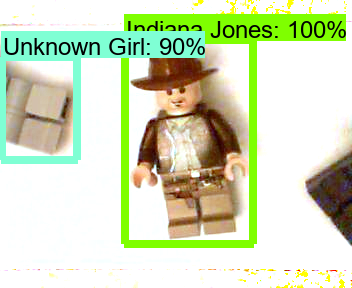

Scores:  [0.99866617 0.83208257 0.18771978]
Boxes:  [[0.21651404 0.3006369  0.86340046 0.70209014]
 [0.29169142 0.00297846 0.7893396  0.13567913]
 [0.28922823 0.00322942 0.7958425  0.13912863]]
Classes:  [1 3 2]


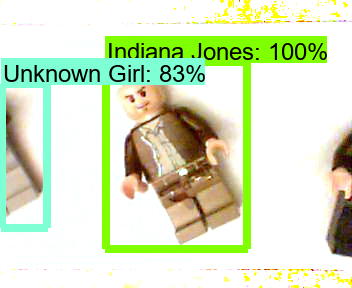

Scores:  [0.996323   0.86723995 0.40282685]
Boxes:  [[0.07487419 0.45614195 0.8135041  0.82946837]
 [0.05152817 0.00204011 0.7572102  0.19089991]
 [0.04435133 0.00138975 0.7488507  0.18935329]]
Classes:  [1 3 2]


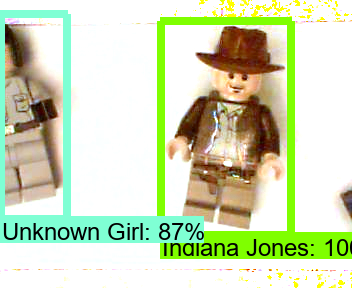

Scores:  [0.99907494 0.16304521 0.11209832]
Boxes:  [[0.16895577 0.60606885 0.9242991  0.9854717 ]
 [0.28935608 0.00254277 0.73612887 0.20921844]
 [0.04558806 0.00237316 0.73285043 0.22854854]]
Classes:  [1 2 3]


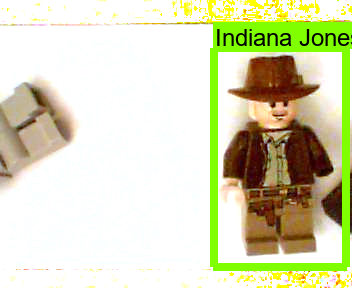

Scores:  [0.99459463 0.9874463  0.02718722]
Boxes:  [[0.15013725 0.5419693  0.8940615  0.94893086]
 [0.25345913 0.00409631 0.7762633  0.21021949]
 [0.21997377 0.01721649 0.8595901  0.22400762]]
Classes:  [1 3 2]


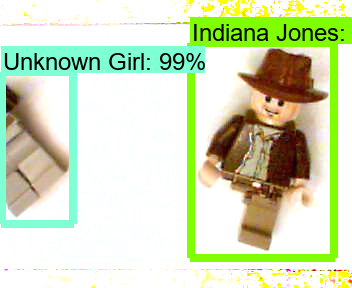

Scores:  [0.9984029  0.9534158  0.14950432]
Boxes:  [[0.21240692 0.2547635  0.77164465 0.82157636]
 [0.21726261 0.00542586 0.5633843  0.21749485]
 [0.2012263  0.8642323  0.907776   1.        ]]
Classes:  [1 3 2]


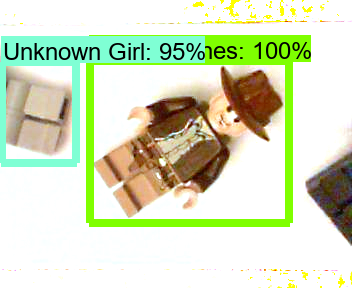

Scores:  [0.99718374 0.9785017  0.13897239]
Boxes:  [[9.61779356e-02 4.59621280e-01 8.55301321e-01 8.29004049e-01]
 [1.15358107e-01 4.96268272e-04 5.73276639e-01 3.34918499e-01]
 [1.18049465e-01 0.00000000e+00 5.76003730e-01 3.39259118e-01]]
Classes:  [1 3 2]


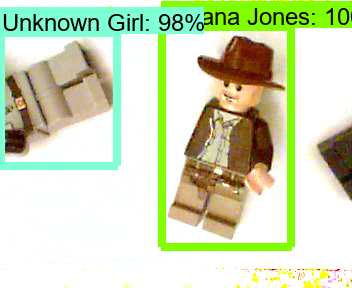

Scores:  [0.9996476  0.97463757 0.12043712]
Boxes:  [[0.15228064 0.36430725 0.86382943 0.7410537 ]
 [0.22438212 0.00580956 0.7194928  0.23029695]
 [0.26331708 0.8555563  0.9533016  0.99687797]]
Classes:  [1 3 2]


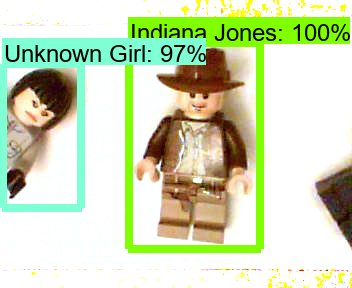

Scores:  [0.12418519 0.08307429 0.02959991]
Boxes:  [[0.87300235 0.         1.         1.        ]
 [0.8716105  0.         1.         0.6256956 ]
 [0.         0.         0.82827896 1.        ]]
Classes:  [1 3 2]


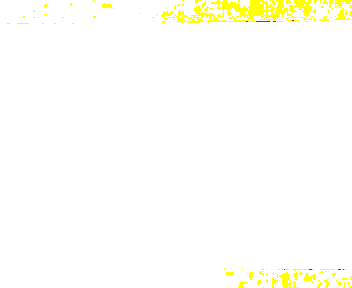

Scores:  [0.99776125 0.3322511  0.07139385]
Boxes:  [[0.13706191 0.44292027 0.8754146  0.83338517]
 [0.16167898 0.89707047 0.7337423  0.99227303]
 [0.16167898 0.89707047 0.7337423  0.99227303]]
Classes:  [1 3 2]


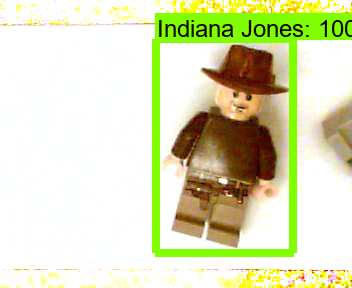

Scores:  [0.9999424  0.98757637 0.18925823]
Boxes:  [[2.0347920e-01 3.1708711e-01 8.5599822e-01 8.1203443e-01]
 [1.4119655e-01 3.2694638e-04 5.8952862e-01 3.2872015e-01]
 [2.1775237e-01 8.8205421e-01 7.6952457e-01 1.0000000e+00]]
Classes:  [1 3 2]


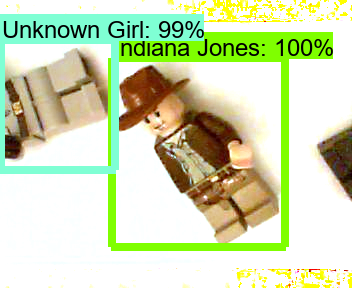

Scores:  [0.9969387  0.96716666 0.08597687]
Boxes:  [[1.1679569e-01 3.8273388e-01 8.2973135e-01 8.0749565e-01]
 [1.6890492e-01 6.2003732e-04 7.4103361e-01 3.2868835e-01]
 [1.7702864e-01 0.0000000e+00 7.4192089e-01 3.4818104e-01]]
Classes:  [1 3 2]


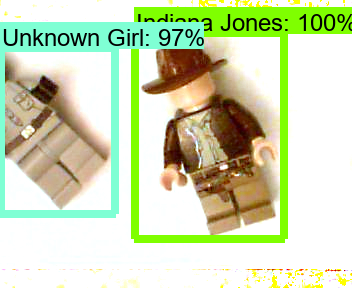

Scores:  [0.99884844 0.9070193  0.42848507]
Boxes:  [[0.18716355 0.30484492 0.91325176 0.680633  ]
 [0.07711533 0.00339723 0.7706561  0.22085965]
 [0.0621378  0.0056591  0.7754956  0.22162536]]
Classes:  [1 3 2]


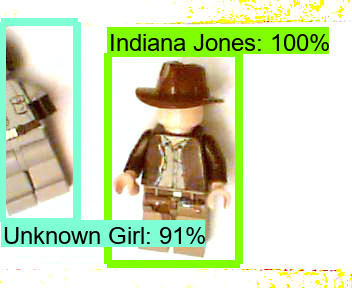

Scores:  [0.999361  0.5821645 0.5623437]
Boxes:  [[1.4275010e-01 4.9512067e-01 8.6462146e-01 8.7612867e-01]
 [1.7447101e-01 1.7656684e-03 8.5268027e-01 1.7537969e-01]
 [1.7205884e-01 4.7536194e-04 8.5264981e-01 1.7402357e-01]]
Classes:  [1 2 3]


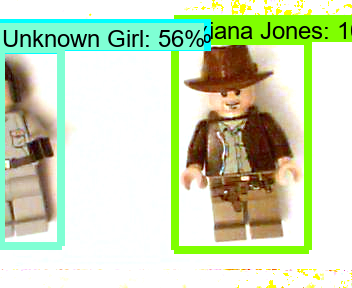

Scores:  [0.99985623 0.57352036 0.06109738]
Boxes:  [[0.21202406 0.27989966 0.80292565 0.6492824 ]
 [0.3468321  0.00553778 0.8200176  0.12432621]
 [0.344157   0.00780118 0.8319694  0.12193573]]
Classes:  [1 2 3]


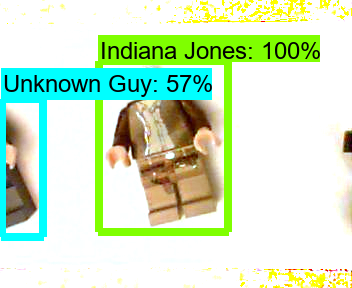

Scores:  [0.9986349 0.9773086 0.8739376]
Boxes:  [[1.8162680e-01 3.4118587e-01 8.5495478e-01 7.0206672e-01]
 [1.9045386e-01 2.5735795e-04 7.8679723e-01 2.6885265e-01]
 [1.7137630e-01 7.7862805e-01 9.1164827e-01 9.9652833e-01]]
Classes:  [1 3 2]


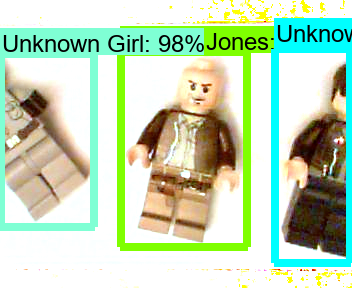

Scores:  [0.99806684 0.10700914 0.07401147]
Boxes:  [[0.09335753 0.3197347  0.801167   0.74428463]
 [0.25901484 0.00161163 0.8144305  0.05633254]
 [0.25901484 0.00161163 0.8144305  0.05633254]]
Classes:  [1 2 3]


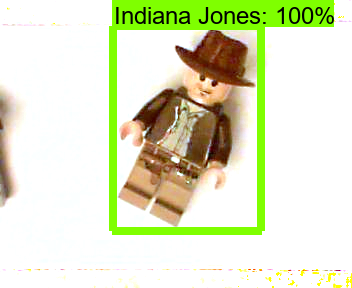

Scores:  [0.9993456  0.68653655 0.09362552]
Boxes:  [[2.9932171e-01 4.4823140e-01 8.6559319e-01 8.8605970e-01]
 [3.5986599e-01 2.3376942e-04 8.6375684e-01 1.5937383e-01]
 [3.0127281e-01 4.5317876e-01 8.6263567e-01 8.8579381e-01]]
Classes:  [1 2 3]


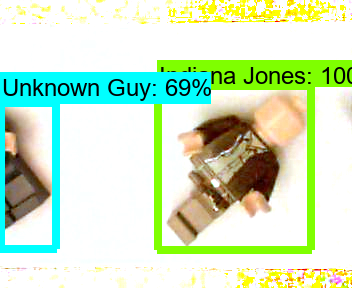

Scores:  [0.9967307  0.98755103 0.03676428]
Boxes:  [[0.32146883 0.32447648 0.8109764  0.8805361 ]
 [0.25234714 0.00423364 0.7761498  0.20684792]
 [0.21580502 0.00848489 0.8334099  0.22741681]]
Classes:  [1 3 2]


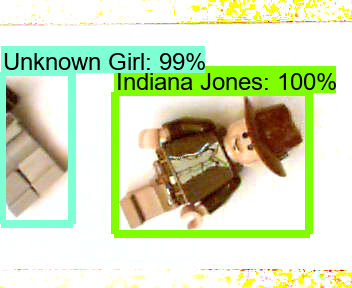

Scores:  [0.99802184 0.9712196  0.29450354]
Boxes:  [[0.12766443 0.35204366 0.8475689  0.7108258 ]
 [0.02896756 0.00331786 0.73016346 0.2729658 ]
 [0.03348878 0.         0.72979605 0.25215134]]
Classes:  [1 3 2]


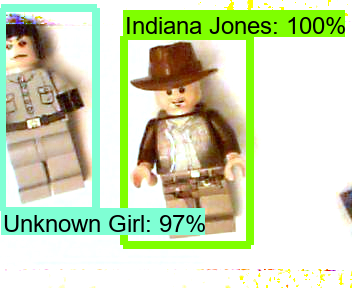

Scores:  [0.9987405  0.18077876 0.02766495]
Boxes:  [[0.15825896 0.5545068  0.907477   0.9162607 ]
 [0.         0.00239403 0.59632784 0.18152961]
 [0.72684985 0.         1.         0.53657377]]
Classes:  [1 3 2]


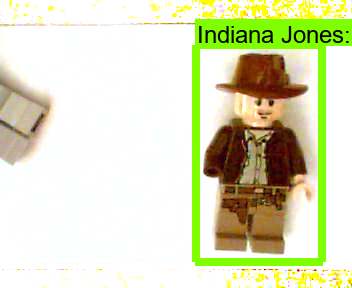

Scores:  [0.99901867 0.97676224 0.17630114]
Boxes:  [[1.5012850e-01 4.7145444e-01 8.6765260e-01 8.4810930e-01]
 [2.4479754e-01 3.9874762e-03 8.4126604e-01 2.1310237e-01]
 [2.3186597e-01 6.8347156e-04 8.4510010e-01 2.1607953e-01]]
Classes:  [1 3 2]


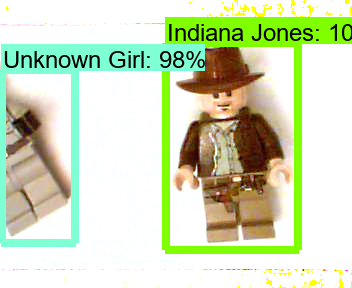

In [6]:
scores = []
boxes = []
classes = []

# read all images from folders given in a list
for imagePath in glob.glob('../../img/All/*.jpg'):

    img = cv2.imread(imagePath)
    if img is None:
        print("Error loading: " + imagePath)
        # end this loop iteration and move on to next image
        continue              
        
    # 1. compensate the background of the image
    img = utils.shadding(img, imgbackground)
    
    # 2. convert to correct colors and to numpy array
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_np = np.asarray(img, dtype='uint8')

    # 3. perform a call to the object detection network
    output_dict = utils.run_inference_for_single_image(model, img_np)
    scores.append(output_dict['detection_scores'])
    boxes.append(output_dict['detection_boxes'])
    classes.append(output_dict['detection_classes'])
    
    print('Scores: ', scores[-1])
    print('Boxes: ', boxes[-1])
    print('Classes: ', classes[-1])                     
    
    # 4. Print the results
    vis_util.visualize_boxes_and_labels_on_image_array(img_np, boxes[-1], classes[-1], scores[-1], category_index, instance_masks=output_dict.get('detection_masks_reframed', None), use_normalized_coordinates=True, line_thickness=8)
    display(Image.fromarray(img_np))

## Call of second AI: Feature Detection

In [7]:
#  machine learning stuff
labelmap_path_indy = "../../config_indy/labelmap.pbtxt"
category_index_indy = label_map_util.create_category_index_from_labelmap(
    labelmap_path_indy, use_display_name=True)
tf.keras.backend.clear_session()
model_indy = tf.saved_model.load('../../model/saved_model_indy')

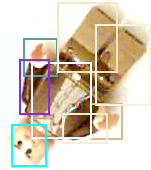

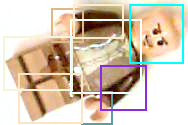

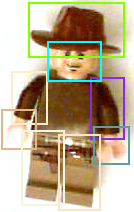

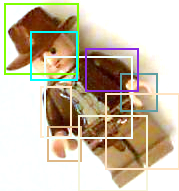

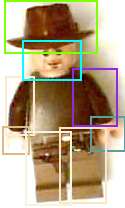

...

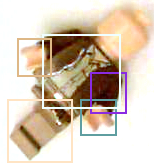

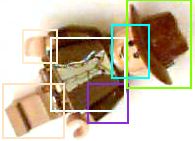

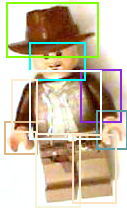

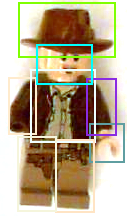

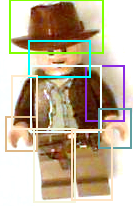

In [8]:
idx = 0

for imagePath in glob.glob('../../img/All/*.jpg'):
    img = cv2.imread(imagePath)
    img = utils.shadding(img, imgbackground)
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
    height, width, _ = img.shape
    
    for x in range(len(scores[idx])):        
        if scores[idx][x] > 0.97 and classes[idx][x] == 1:
            # Crop images in the bounding box region
            y_min = int(boxes[idx][x][0] * height)
            y_max = int(boxes[idx][x][2] * height)
            x_min = int(boxes[idx][x][1] * width)
            x_max = int(boxes[idx][x][3] * width)
            w = x_max - x_min
            h = y_max - y_min
            
            crop_img = img[y_min:y_min + h, x_min:x_min + w]  
            
            output_dict = utils.run_inference_for_single_image(model_indy, crop_img)            

            # 4. Print the results
            vis_util.visualize_boxes_and_labels_on_image_array(crop_img, output_dict['detection_boxes'], output_dict['detection_classes'], output_dict['detection_scores'], category_index_indy, instance_masks=output_dict.get('detection_masks_reframed', None), use_normalized_coordinates=True, line_thickness=2, min_score_thresh=0.9, skip_scores=True, skip_labels=True)
            display(Image.fromarray(crop_img))
            
    idx = idx + 1     

## Combined version with verification included 

Tests 0/30 failed
Tests 0/10 failed
Error in picture ../../img/2-NoFace\image_047.jpg
[0.9999956  0.99999464 0.9999919  0.99992776 0.9999274  0.9998355
 0.9998135  0.08466596 0.06664518 0.03484323]
[ 8  7  1  4  5  6  9  3 10  2]


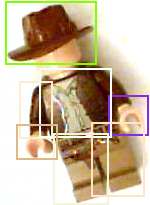

Tests 1/10 failed
Error in picture ../../img/3-NoLeftLeg\image_055.jpg
Error in picture ../../img/3-NoLeftLeg\image_055.jpg
[0.9999974  0.9999894  0.99996877 0.99994874 0.9985549  0.9972326
 0.07573517 0.06757732 0.05856074 0.05353573]
[ 8  4  7  6  1  2  3  9 10  5]


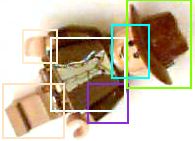

Error in picture ../../img/3-NoLeftLeg\image_056.jpg
[0.99999404 0.9999732  0.99981815 0.99728894 0.9945076  0.95709246
 0.9301511  0.29524836 0.2440833  0.17526883]
[ 6  4 10  1  7  2  8  9  5  3]


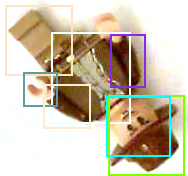

Tests 2/5 failed
Tests 0/5 failed
Tests 0/1 failed
Tests 0/5 failed
Tests 0/4 failed
Tests 0/10 failed
Tests 0/10 failed
Error in picture ../../img/10-NoLeftArm\image_126.jpg
[0.9999232  0.9999175  0.999874   0.99979323 0.9987381  0.99435014
 0.5177576  0.01824981]
[10  4  6  8  5  1  2  7]


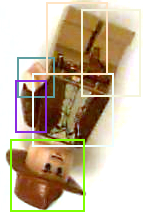

Tests 1/4 failed
Tests 0/5 failed
Tests 0/1 failed
Tests 0/1 failed
Tests 0/1 failed
Tests 0/1 failed
Tests 0/1 failed
Tests 0/1 failed
Tests 0/1 failed
Tests 0/1 failed
Tests 0/1 failed
Tests 0/1 failed
Tests 0/1 failed
Tests 0/1 failed
Tests 0/1 failed
Tests 0/11 failed
Total Tests 4/123 failed
Accuracy: 96.7479674796748%


In [11]:
featurePaths= ['../../img/0-Normal/*.jpg', 
            '../../img/1-NoHat/*.jpg',
            '../../img/2-NoFace/*.jpg',
            '../../img/3-NoLeftLeg/*.jpg',
            '../../img/4-NoRightLeg/*.jpg',
            '../../img/5-NoHands/*.jpg',
            '../../img/6-NoLeftHand/*.jpg',
            '../../img/7-NoRightHand/*.jpg',
            '../../img/8-NoHead/*.jpg',
            '../../img/9-NoBodyPrint/*.jpg',
            '../../img/10-NoLeftArm/*.jpg',
            '../../img/11-NoRightArm/*.jpg',
            '../../img/12-NoArms/*.jpg',
            '../../img/13-Combo/*.jpg',
            '../../img/14-Combo/*.jpg',
            '../../img/15-Combo/*.jpg',
            '../../img/16-Combo/*.jpg',
            '../../img/17-Combo/*.jpg',
            '../../img/18-Combo/*.jpg',
            '../../img/19-Combo/*.jpg',
            '../../img/20-Combo/*.jpg',
            '../../img/21-Combo/*.jpg',
            '../../img/22-Combo/*.jpg',
            '../../img/23-Combo/*.jpg',
            '../../img/24-Combo/*.jpg',
            '../../img/Other/*.jpg']

featureForPath = [[1,2,4,5,6,7,8,9,10],
                 [2,4,5,6,7,8,9,10],
                 [1,4,5,6,7,8,9,10],
                 [1,2,4,6,7,8,9,10],
                 [1,2,4,5,7,8,9,10],
                 [1,2,4,5,6,7,8],
                 [1,2,4,5,6,7,8,10],
                 [1,2,4,5,6,7,8,9],
                 [3,4,5,6,7,8,9,10],
                 [1,2,5,6,7,8,9,10],
                 [1,2,4,5,6,8,10],
                 [1,2,4,5,6,7,9],
                 [1,2,4,5,6],
                 [2,4,5,6,7,8,9],
                 [4,6,7,8,9,10],
                 [1,4,6,7,8,9,10],
                 [4,7,8,9,10],
                 [3,4,6,7,8,10],
                 [1,2,4,6,7,8,9],
                 [4,6,7,8,9,10],
                 [1,4,5,7,8,9,10],
                 [4,5,6,7,8],
                 [1,4,5,6,7,8,10],
                 [4,5,6,8,10],
                 [1,2,4,5,8,10]]

total_errors = 0
total_pics = 0

idx = 0
for fp in featurePaths:
    total = 0;
    error_counter = 0;
    for imagePath in glob.glob(fp):
        total = total + 1
        img = cv2.imread(imagePath)
        if img is None:
            print("Error loading: " + imagePath)
            # end this loop iteration and move on to next image
            continue      
            
        height, width, _ = img.shape

        # 1. compensate the background of the image
        img = utils.shadding(img, imgbackground)

        # 2. convert to correct colors and to numpy array
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        img_np = np.asarray(img, dtype='uint8')

        # 3. perform a call to the object detection network
        output_dict = utils.run_inference_for_single_image(model, img_np)
        scores = output_dict['detection_scores']
        boxes = output_dict['detection_boxes']
        classes = output_dict['detection_classes']
        
        for x in range(len(scores)):        
            if scores[x] > 0.97 and classes[x] == 1:
                # Crop images in the bounding box region
                y_min = int(boxes[x][0] * height)
                y_max = int(boxes[x][2] * height)
                x_min = int(boxes[x][1] * width)
                x_max = int(boxes[x][3] * width)
                w = x_max - x_min
                h = y_max - y_min

                crop_img = img[y_min:y_min + h, x_min:x_min + w]  

                output_dict = utils.run_inference_for_single_image(model_indy, crop_img)
                
                scores_indy = output_dict['detection_scores']
                classes_indy = output_dict['detection_classes']
                
                flag = True;
                
                for y in range(len(featureForPath[idx])):
                    if featureForPath[idx][y] in classes_indy:
                        elem_index = np.where(classes_indy == featureForPath[idx][y])
                        if scores_indy[elem_index] < 0.90:
                            # left arm missing but hand is found
                            if classes_indy[elem_index] == 7 and 9 in classes_indy and scores_indy[np.where(classes_indy == 9)] > 0.9:
                                continue
                            # left arm missing but hand is found
                                continue
                            flag = False
                            print("Error in picture {0}".format(imagePath))
                
                if not flag:
                    error_counter = error_counter + 1
                    print(scores_indy)
                    print(classes_indy)
                    vis_util.visualize_boxes_and_labels_on_image_array(crop_img, output_dict['detection_boxes'], output_dict['detection_classes'], output_dict['detection_scores'], category_index_indy, instance_masks=output_dict.get('detection_masks_reframed', None), use_normalized_coordinates=True, line_thickness=2, min_score_thresh=0.9, skip_scores=True, skip_labels=True)
                    display(Image.fromarray(crop_img))
  
    idx = idx + 1
    
    print("Tests {0}/{1} failed".format(error_counter,total))
    
    total_errors = total_errors + error_counter
    total_pics = total_pics + total 

print("Total Tests {0}/{1} failed".format(total_errors,total_pics))
print("Accuracy: {0}%".format((1-(total_errors/total_pics))*100))